@meoskis задачка тебе: поработать с датасетом
попробуй загрузи его, проведи его базовый анализ, есть ли там пропуски, наличие спец символов и так далее
ну и почитай как вообще анализировать такие текстовые датасеты, какие там могут быть метрики

## Возникшие вопросы:

1) При анализе комментров следует ли выбрасывать из рассмотрения ссылки (брать только текст комментария). С одной стороны в ссылке может быть нужное решения с правильными словами, когда текст комма будет не полным. С другой как убедится, что она допустим не фишинговая?

## Полезнеые ссылки:

https://towardsdatascience.com/getting-started-with-text-analysis-in-python-ca13590eb4f7

## Информация о датасете:

Данные содержат тренировочную (ranking_train.jsonl) и тестовую (ranking_test.jsonl) выборки.

В каждом файле почти одинаковый формат:
- Отдельная строчка в файле — валидный JSON с семплом
- Каждый JSON имеет поле text с текстом поста и массив сomments из 5 элементов
- Каждый элемент массива это словарь с ключами text с текстом комментария и score с позицией ранжирования (0 cоответствует самому популярному комментарию, 4 самому непопулярному)
- В тестовом файле в поле score стоит null

Заполните тестовую выборку, т.е. расставьте в файле ranking_test.jsonl вместо null значения score. В рамках одного семпла они должны быть от 0 до 4 и не должны повторяться.
Пришлите файл с результатами вместе с кодом и презентацией.

По валидации - будем смотреть на NDCG метрику (hint: она уже есть в библиотеке sklearn). 
В целом, хочется видеть рассуждения, поэтому можно предлагать и другие способы оценки.

## Код

In [24]:
import json
from bs4 import BeautifulSoup
import pandas as pd
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
import nltk
import copy
from nltk.stem import WordNetLemmatizer, PorterStemmer, SnowballStemmer
from collections import Counter
import re
import html
import numpy as np
from textblob import TextBlob
from scipy import stats
import matplotlib.pyplot as plt

In [ ]:
#pip install squarify 
import squarify 

In [3]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [4]:
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


True

In [5]:
nltk.download('punkt')

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.


True

In [6]:
ranking_test = pd.read_json("/content/drive/MyDrive/Кейс/Data/ranking_test.jsonl", lines=True)
ranking_test

,text,comments
0,"iOS 8.0.1 released, broken on iPhone 6 models,...",[{'text': 'I&#x27;m still waiting for them to ...
1,Ask HN: How do US HNers get their health insur...,[{'text': 'Get it from your employer. It&#x27;...
2,San Diego Researcher Crowdfunding Patent-Free ...,[{'text': 'What I don&#x27;t understand is why...
3,Rethinking the origins of the universe,[{'text': 'I&#x27;m not a physicist. I imagin...
4,SlackTextViewController: A new growing text in...,[{'text': 'As someone that doesn&#x27;t do iOS...
...,...,...
13999,The cat's miaow,"[{'text': 'Meanwhile in the US, Stubbs has bee..."
14000,Facebook’s Piracy Problem,[{'text': 'A radical idea: Maybe our model of ...
14001,Go GC: Solving the Latency Problem in Go 1.5,[{'text': 'Was the presentation more in-depth ...
14002,Understanding Neural Networks Through Deep Vis...,[{'text': 'Ok now I want to &quot;hear&quot; o...


In [7]:
ranking_train = pd.read_json("/content/drive/MyDrive/Кейс/Data/ranking_train.jsonl", lines=True)
ranking_train

,text,comments
0,How many summer Y Combinator fundees decided n...,[{'text': 'Going back to school is not identic...
1,CBS acquires last.fm for $280m,[{'text': 'It will be curious to see where thi...
2,How Costco Became the Anti-Wal-Mart,[{'text': 'I really hate it when people falsel...
3,"Fortune Favors Big Turds | Screw The Money, Th...",[{'text': 'His real point is that something ca...
4,StartupWeekend: 70 Founders Create One Company...,[{'text': 'Looks like someone hasn't read The ...
...,...,...
88102,Don't upgrade to iOS 8.0.1 or you may experien...,[{'text': 'I had this issue and was able to fi...
88103,Ask HN: How do US HNers get their health insur...,[{'text': 'We use a HSA-qualified high-deducti...
88104,Justin Gordon Using React on Rails,[{'text': 'neat insight! A friend of mine conv...
88105,"iOS 8.0.1 released, broken on iPhone 6 models,...","[{'text': 'Ouch, I feel for whoever let this s..."


In [8]:
ranking_train.iloc[0]['text']

'How many summer Y Combinator fundees decided not to continue with their startup and go back to school? and what were the reasons?'

In [9]:
ranking_train.iloc[0]['comments']

[{'text': 'Going back to school is not identical with giving up. Some founders go back to school and keep working on the startup while there.  However, those do so much worse than the people who work on the startup full-time that going back to school seems, in practice, not too far removed from a death sentence for a startup.Off the top of my head, I\'d guess we\'ve had about 8 startups where the founders went back to school.  It doesn\'t only happen with summer batches.  Founders from winter batches do it too.Usually the reason is that the startup isn\'t doing very well. However, that judgement depends a lot on how determined the founders are.  One reason we now shy away from funding people still in school is that they often unconsciously want the startup to fail, because the idea of dropping out frightens them.A lot of startups look bad after 3 months.  Someone who\'s out of school and has to make it work or get a job in a cubicle will say "don\'t worry, we\'ll figure out how to make

In [10]:
ranking_test.iloc[0]['comments']

[{'text': 'I&#x27;m still waiting for them to stabilize wifi on the iPad sith iOS 8. Their quality has really started to slip for me since 10.9 on Mac.',
  'score': None},
 {'text': 'For those who upgraded, no need to do a restore. You can just option-click &quot;Update&quot; and downgrade the OS back to 8.0.0.Instructions: https:&#x2F;&#x2F;gist.github.com&#x2F;locriani&#x2F;f0f5f4f71a28945c3750',
  'score': None},
 {'text': 'Upgraded shortly after it was released and suffered the consequences.  Just was able to restore back down to 8.0I had to turn iMessage off and back on again in order for Apple to re-register my number... until then I was unable to send to any existing contacts.',
  'score': None},
 {'text': 'I think they were under a lot of pressure on the HealthKit front.  That was one of their big flagship iOS 8 features, they got all these app developers to integrate it, then iOS 8 shipped and they had a showstopper bug and wouldn&#x27;t release any apps using HealthKit.',
  '

In [11]:
# Шаг 1. Преобразование датафрейма

ranking_train_exploded = ranking_train.explode('comments')
ranking_train_exploded = pd.concat([ranking_train_exploded.drop(['comments'], axis=1), ranking_train_exploded['comments'].apply(pd.Series).rename(columns={'text':'comments'})], axis=1)

In [12]:
nltk.download('wordnet')

[nltk_data] Downloading package wordnet to /root/nltk_data...


True

In [13]:
nltk.download('omw-1.4')

[nltk_data] Downloading package omw-1.4 to /root/nltk_data...


True

In [14]:
ranking_train_exploded

,text,comments,score
0,How many summer Y Combinator fundees decided n...,Going back to school is not identical with giv...,0
0,How many summer Y Combinator fundees decided n...,There will invariably be those who don't see t...,1
0,How many summer Y Combinator fundees decided n...,For me school is a way to be connected to what...,2
0,How many summer Y Combinator fundees decided n...,I guess it really depends on how hungry you ar...,3
0,How many summer Y Combinator fundees decided n...,I know pollground decided to go back to school...,4
...,...,...,...
88106,Pay your rent with a Credit or Debit card. No ...,Most major banks offer a service called &#x27;...,0
88106,Pay your rent with a Credit or Debit card. No ...,"It costs 3.25%, or $74.25 for the example of $...",1
88106,Pay your rent with a Credit or Debit card. No ...,As many other comments have pointed out almost...,2
88106,Pay your rent with a Credit or Debit card. No ...,My apartment building uses Yapstone&#x27;s Ren...,3


In [15]:
# Шаг 2. Токенезирование строк и удаление стоп-слов и лемитизация слов

lemmatizer = WordNetLemmatizer()
stop_words = set(stopwords.words('english'))
tokenizer = nltk.tokenize.RegexpTokenizer(r'\w+')

def word_tokenizer(string):
    string = html.unescape(string.lower())    # Избавляемя от html-формата записи строк
    string = re.sub(r'_', '', string)         # Убираем все нижние подчеркивания
    string = re.sub(r'http\S+', '', string)   # Убираем все ссылки
    string = re.sub(r'\W+\d+\W+', '', string) # Убираем одиноко стоящие цифары и чисала
    
    return [lemmatizer.lemmatize(word) for word in tokenizer.tokenize(string) if not word in stop_words]

In [16]:
test = copy.deepcopy(ranking_train_exploded)

test['text'] = test.apply(lambda row: word_tokenizer(row['text']), axis=1)
test['comments'] = test.apply(lambda row: word_tokenizer(row['comments']), axis=1)

In [17]:
test[test['comments'].apply(len) == 0]

,text,comments,score
16,"[provisional, patent, filing, tip]",[],4
71,[money],[],4
85,"[anyone, phoenix, az]",[],4
105,"[nah, seriously, design, yc, startup, website,...",[],2
142,"[finish, sentence]",[],4
...,...,...,...
87925,"[new, app, allows, blind, people, listen, audi...",[],4
87959,"[ask, hn, xemacs, still, exist]",[],3
87995,"[ios1, x, pdf, exploit, cve4377]",[],0
88038,"[standupmail, simple, email, based, productivi...",[],0


In [17]:
all_words = [element for list_ in test['comments'] for element in list_]
data = pd.DataFrame(Counter(all_words).most_common())

## Графики

In [80]:
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib import rcParams
import matplotlib.font_manager as fm

path = '/content/drive/MyDrive/Кейс/Fonts/vk-sans.ttf'
fontprop = fm.FontProperties(fname=path, size= 15)

# Настройки для фигуры на графике

rcParams['figure.figsize'] = (30, 15) # Размер фигуры
rcParams['figure.dpi'] = 300 # Количество точек на дюйм
rcParams['font.size'] = 20 # Размер шрифта
rcParams['axes.titlesize'] = 24 # Размер для заголовков графиков

# Настройка для осей

rcParams['xtick.labelsize'] = 20 # Размер шрифта для подписей на оси x
rcParams['ytick.labelsize'] = 20 # Размер шрифта для подписей на оси y

rcParams['xtick.major.size'] = 12 # Длинна "главных засечек на оси X"
rcParams['xtick.minor.size'] = 7 # Длинна "неглавных засечек"
rcParams['xtick.major.width'] = 3 #Ширина "главных засечек"
rcParams['xtick.minor.width'] = 1.5 #Ширина "неглавных засечек"

rcParams['ytick.major.size'] = 12 # Длинна "главных засечек на оси Y"
rcParams['ytick.minor.size'] = 7 # Длинна "неглавных засечек на оси Y"
rcParams['ytick.major.width'] = 3 # Ширина "главных засечек на оси Y"
rcParams['ytick.minor.width'] = 1.5 # Ширина "главных засечек на оси Y"

rcParams['axes.labelsize'] = 20 # Настройка размера подписей по осям

# Настройка вспомогательной сетки

rcParams['grid.color'] = 'DarkTurquoise' # Цвет сетки
rcParams['grid.linestyle'] = ':' # Тип линий сетки
rcParams['grid.linewidth'] = 2 # Ширина линий сетки

# Настройка легенды

rcParams['legend.loc'] = 'best' # расположение легенды
rcParams['legend.fontsize'] = 'large' # размер шрифта в легенде

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

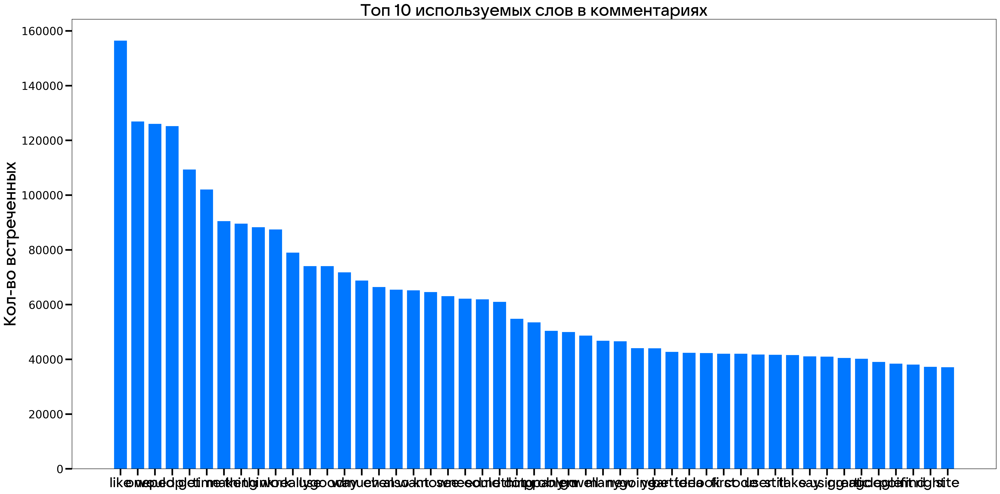

In [19]:
fig, ax = plt.subplots()

n = 50

words = data[0].head(n).to_list()[:-1]
freq = data[1].head(n).to_list()[:-1]

ax.bar(words, freq, width=0.75, color='#0077ff')

ax.set_title('Топ 10 используемых слов в комментариях', fontproperties=fontprop, size=30)
ax.set_ylabel('Кол-во встреченных', fontproperties=fontprop, size=30)

plt.xticks(fontproperties=fontprop, size=25)

from google.colab import files

plt.savefig("freq_of_commwords.png", transparent=True)
files.download("freq_of_commwords.png") 

In [20]:
# from PIL import Image
# import matplotlib.pyplot as plt
# import os

# from wordcloud import WordCloud, STOPWORDS

# text = ' '.join(all_words)

# vk_mask = np.array(Image.open("/content/drive/MyDrive/Кейс/VK_BW_Compact_Logo.png"))

# wc = WordCloud(background_color="white", max_words=150, contour_width=3, mask=vk_mask, contour_color='steelblue')

# # generate word cloud
# wc.generate(text)

# # store to file
# wc.to_file("/content/drive/MyDrive/Кейс/WordCloud_comments.png")

In [21]:
series_of_bad_comms = test[test['comments'].apply(len) == 0].groupby('score').count()['comments']

In [22]:
series_of_bad_comms.to_list()

[131, 178, 266, 339, 411]

In [23]:
series_of_bad_comms.index

Int64Index([0, 1, 2, 3, 4], dtype='int64', name='score')

(array([-1.,  0.,  1.,  2.,  3.,  4.,  5.]),
 [Text(-1.0, 0, '−1'),
  Text(0.0, 0, '0'),
  Text(1.0, 0, '1'),
  Text(2.0, 0, '2'),
  Text(3.0, 0, '3'),
  Text(4.0, 0, '4'),
  Text(5.0, 0, '5')])

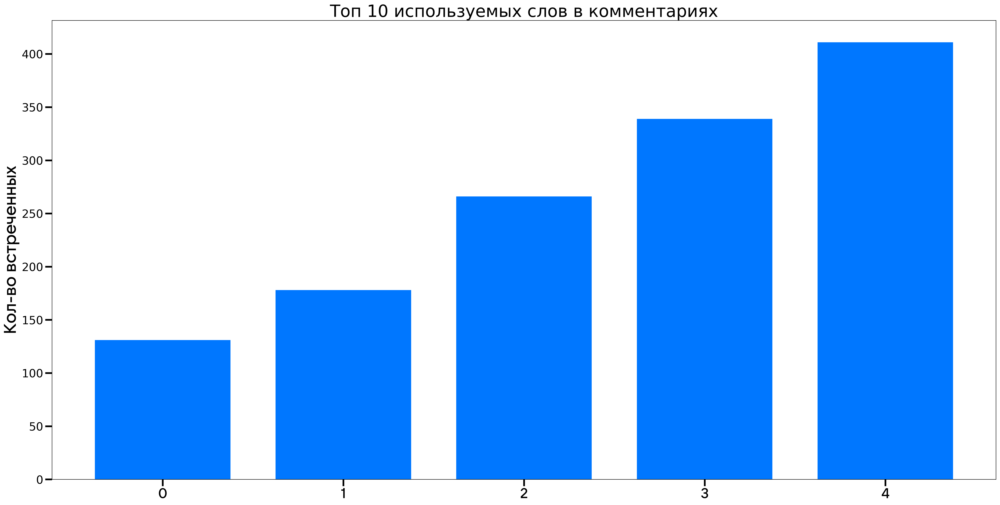

In [24]:
fig, ax = plt.subplots()

ax.bar(list(series_of_bad_comms.index), series_of_bad_comms.to_list(), width=0.75, color='#0077ff')

ax.set_title('Топ 10 используемых слов в комментариях', size=30)
ax.set_ylabel('Кол-во встреченных', fontproperties=fontprop, size=30)

plt.xticks(fontproperties=fontprop, size=25)

#plt.savefig("freq_of_commwords.png", transparent=True)
#files.download("freq_of_commwords.png") 

In [25]:
from textblob import TextBlob

In [63]:
ranking_train_exploded['polarity'] = ranking_train_exploded['comments'].apply(lambda text: TextBlob(text).sentiment[0])
ranking_train_exploded['subjectivity'] = ranking_train_exploded['comments'].apply(lambda text: TextBlob(text).sentiment[1])
ranking_train_exploded['num_of_symbols'] = ranking_train_exploded['comments'].apply(len)
ranking_train_exploded['num_of_words'] = ranking_train_exploded['comments'].apply(lambda x: len(x.split(sep=' ')))
ranking_train_exploded['num_of_stop_words'] = ranking_train_exploded['comments'].apply(lambda x: len(x.split(sep=' '))-len([word for word in x.split(sep=' ') if word not in stop_words]))
ranking_train_exploded['percent_of_stop_words_with_all_words'] = ranking_train_exploded['num_of_stop_words']/ranking_train_exploded['num_of_words']
ranking_train_exploded['percent_of_len_stop_words'] = 1 - ranking_train_exploded['comments'].apply(lambda x: len(' '.join([word for word in x.split(sep=' ') if word not in stop_words])))/ranking_train_exploded['num_of_symbols']
ranking_train_exploded['avg_len_word'] = ranking_train_exploded['num_of_symbols']/ranking_train_exploded['num_of_words']

In [27]:
subjectivity_data_df = ranking_train_exploded[['subjectivity', 'score']]

subjectivity_data = [
    subjectivity_data_df[subjectivity_data_df['subjectivity'] <= subjectivity_data_df['subjectivity'].quantile(0.25)].groupby('score').count()['subjectivity'].tolist(),
    subjectivity_data_df[(subjectivity_data_df['subjectivity'] > subjectivity_data_df['subjectivity'].quantile(0.25)) & (subjectivity_data_df['subjectivity'] <= subjectivity_data_df['subjectivity'].quantile(0.5))].groupby('score').count()['subjectivity'].tolist(),
    subjectivity_data_df[(subjectivity_data_df['subjectivity'] > subjectivity_data_df['subjectivity'].quantile(0.5)) & (subjectivity_data_df['subjectivity'] <= subjectivity_data_df['subjectivity'].quantile(0.75))].groupby('score').count()['subjectivity'].tolist(),
    subjectivity_data_df[(subjectivity_data_df['subjectivity'] > subjectivity_data_df['subjectivity'].quantile(0.75)) & (subjectivity_data_df['subjectivity'] <= subjectivity_data_df['subjectivity'].quantile(1))].groupby('score').count()['subjectivity'].tolist()
    ]

subjectivity_data

[[16536, 19937, 22369, 24601, 26691],
 [27029, 23535, 21500, 19939, 18131],
 [25951, 23357, 21579, 20158, 19164],
 [18591, 21278, 22659, 23409, 24121]]

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

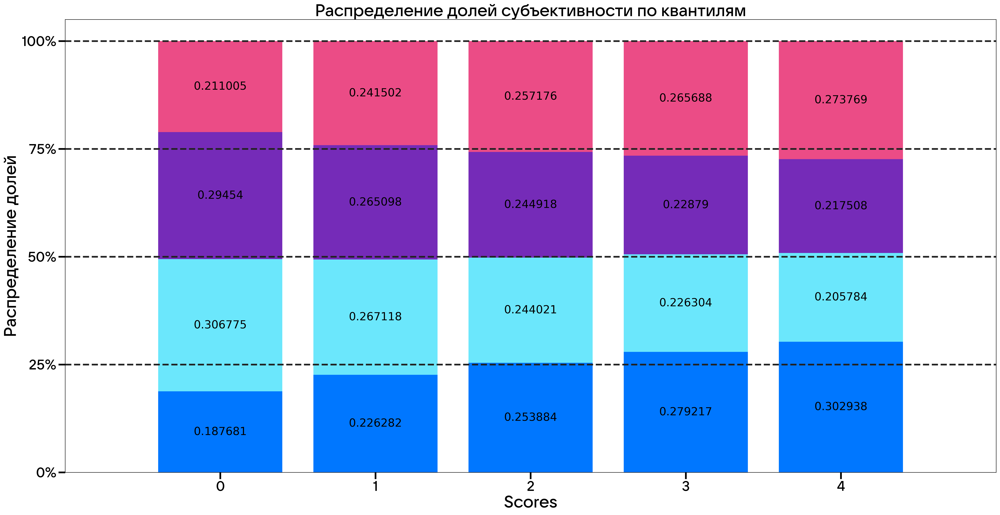

In [28]:
import matplotlib.ticker as mtick

x = ['0', '1', '2', '3', '4']
s1,s2,s3,s4 = np.array(subjectivity_data) / np.array(subjectivity_data).sum(axis=0)[0]
 
# plot bars in stack manner
bar1 = plt.bar(x, s1, color='#0077ff')
bar2 = plt.bar(x, s2, bottom=s1, color='#6be7fc')
bar3 = plt.bar(x, s3, bottom=s1+s2, color='#752bb8')
bar4 = plt.bar(x, s4, bottom=s1+s2+s3, color='#EB4C86')
plt.bar_label(bar1, label_type='center')
plt.bar_label(bar2, label_type='center')
plt.bar_label(bar3, label_type='center')
plt.bar_label(bar4, label_type='center')

plt.hlines(0.25, -1, 5, color='#222', label='25%', linestyles = 'dashed', linewidth=3)
plt.hlines(0.50, -1, 5, color='#222', label='50%', linestyles = 'dashed', linewidth=3)
plt.hlines(0.75, -1, 5, color='#222', label='75%', linestyles = 'dashed', linewidth=3)
plt.hlines(1, -1, 5, color='#222', label='100%'  , linestyles = 'dashed', linewidth=3)

plt.xlim(-1,5)
plt.yticks(np.arange(0,1.25,0.25))

plt.gca().yaxis.set_major_formatter(mtick.PercentFormatter(xmax=1.0))
plt.xlabel("Scores", fontproperties=fontprop, size=30)
plt.ylabel("Распределение долей", fontproperties=fontprop, size=30)
plt.xticks(fontproperties=fontprop, size=25)
plt.yticks(fontproperties=fontprop, size=25)
plt.title("Распределение долей субъективности по квантилям", fontproperties=fontprop, size=30)

plt.savefig("Распределение долей субъективности по квантилям.png", transparent=True)
files.download("Распределение долей субъективности по квантилям.png") 

In [29]:
polyarity_data_df = ranking_train_exploded[['polarity', 'score']]

polarity_data = [
    polyarity_data_df[polyarity_data_df['polarity'] <= polyarity_data_df['polarity'].quantile(0.25)].groupby('score').count()['polarity'].tolist(),
    polyarity_data_df[(polyarity_data_df['polarity'] > polyarity_data_df['polarity'].quantile(0.25)) & (polyarity_data_df['polarity'] <= polyarity_data_df['polarity'].quantile(0.5))].groupby('score').count()['polarity'].tolist(),
    polyarity_data_df[(polyarity_data_df['polarity'] > polyarity_data_df['polarity'].quantile(0.5)) & (polyarity_data_df['polarity'] <= polyarity_data_df['polarity'].quantile(0.75))].groupby('score').count()['polarity'].tolist(),
    polyarity_data_df[(polyarity_data_df['polarity'] > polyarity_data_df['polarity'].quantile(0.75)) & (polyarity_data_df['polarity'] <= polyarity_data_df['polarity'].quantile(1))].groupby('score').count()['polarity'].tolist()
    ]

polarity_data

[[18470, 21912, 24418, 26860, 29420],
 [25297, 21312, 19245, 17301, 16033],
 [26260, 23518, 21605, 20206, 18585],
 [18080, 21365, 22839, 23740, 24069]]

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

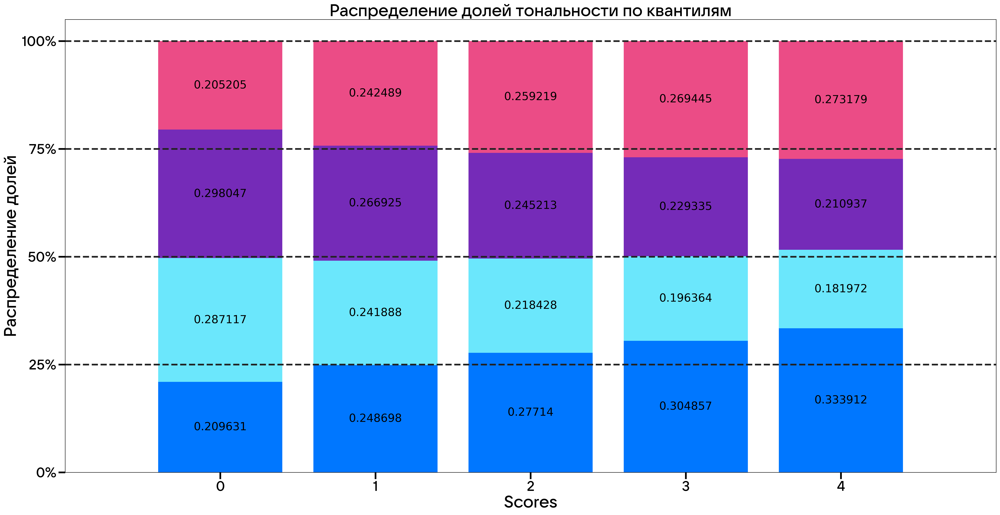

In [30]:
import matplotlib.ticker as mtick

x = ['0', '1', '2', '3', '4']
s1,s2,s3,s4 = np.array(polarity_data) / np.array(polarity_data).sum(axis=0)[0]
 
# plot bars in stack manner
bar1 = plt.bar(x, s1, color='#0077ff')
bar2 = plt.bar(x, s2, bottom=s1, color='#6be7fc')
bar3 = plt.bar(x, s3, bottom=s1+s2, color='#752bb8')
bar4 = plt.bar(x, s4, bottom=s1+s2+s3, color='#EB4C86')
plt.bar_label(bar1, label_type='center')
plt.bar_label(bar2, label_type='center')
plt.bar_label(bar3, label_type='center')
plt.bar_label(bar4, label_type='center')

plt.hlines(0.25, -1, 5, color='#222', label='25%', linestyles = 'dashed', linewidth=3)
plt.hlines(0.50, -1, 5, color='#222', label='50%', linestyles = 'dashed', linewidth=3)
plt.hlines(0.75, -1, 5, color='#222', label='75%', linestyles = 'dashed', linewidth=3)
plt.hlines(1, -1, 5, color='#222', label='100%'  , linestyles = 'dashed', linewidth=3)

plt.xlim(-1,5)
plt.yticks(np.arange(0,1.25,0.25))

plt.gca().yaxis.set_major_formatter(mtick.PercentFormatter(xmax=1.0))
plt.xlabel("Scores", fontproperties=fontprop, size=30)
plt.ylabel("Распределение долей", fontproperties=fontprop, size=30)
plt.xticks(fontproperties=fontprop, size=25)
plt.yticks(fontproperties=fontprop, size=25)
plt.title("Распределение долей тональности по квантилям", fontproperties=fontprop, size=30)

plt.savefig("Распределение долей тональности по квантилям.png", transparent=True)
files.download("Распределение долей тональности по квантилям.png") 

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

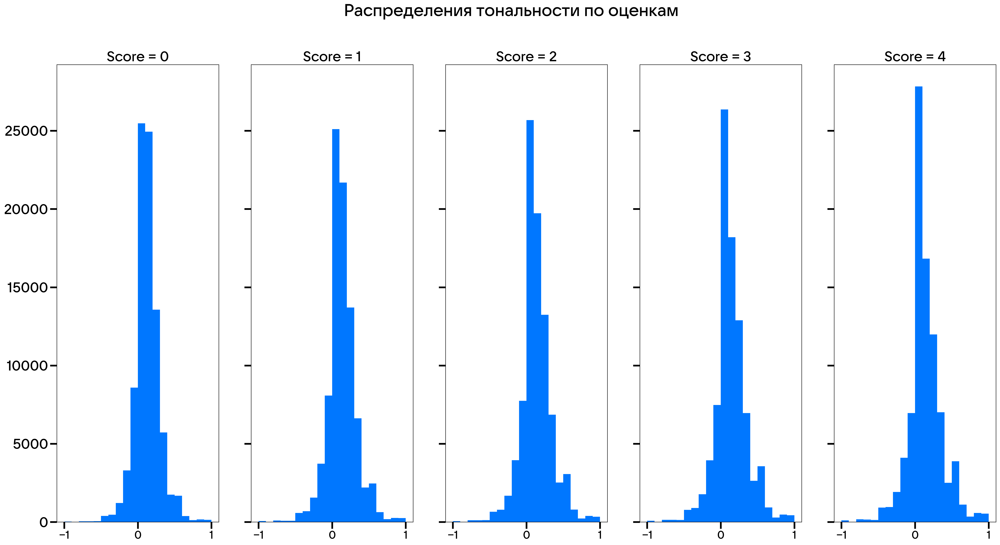

In [31]:
fig, axs = plt.subplots(1, 5, sharey=True)
axs[0].hist(ranking_train_exploded[ranking_train_exploded['score'] == 0]['polarity'], bins=20, color = '#0077ff')
axs[1].hist(ranking_train_exploded[ranking_train_exploded['score'] == 1]['polarity'], bins=20, color = '#0077ff')
axs[2].hist(ranking_train_exploded[ranking_train_exploded['score'] == 2]['polarity'], bins=20, color = '#0077ff')
axs[3].hist(ranking_train_exploded[ranking_train_exploded['score'] == 3]['polarity'], bins=20, color = '#0077ff')
axs[4].hist(ranking_train_exploded[ranking_train_exploded['score'] == 4]['polarity'], bins=20, color = '#0077ff')

axs[0].set_title('Score = 0', fontproperties=fontprop, size=25)
axs[1].set_title('Score = 1', fontproperties=fontprop, size=25)
axs[2].set_title('Score = 2', fontproperties=fontprop, size=25)
axs[3].set_title('Score = 3', fontproperties=fontprop, size=25)
axs[4].set_title('Score = 4', fontproperties=fontprop, size=25)

fig.suptitle("Распределения тональности по оценкам", fontproperties=fontprop, size=30)
plt.sca(axs[1])
plt.xticks(fontproperties=fontprop, size=20)
plt.sca(axs[2])
plt.xticks(fontproperties=fontprop, size=20)
plt.sca(axs[3])
plt.xticks(fontproperties=fontprop, size=20)
plt.sca(axs[4])
plt.xticks(fontproperties=fontprop, size=20)
plt.sca(axs[0])
plt.xticks(fontproperties=fontprop, size=20)
plt.yticks(fontproperties=fontprop, size=20)
plt.yticks(fontproperties=fontprop, size=25)

plt.savefig("Распределения тональности по оценкам.png", transparent=True)
files.download("Распределения тональности по оценкам.png")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

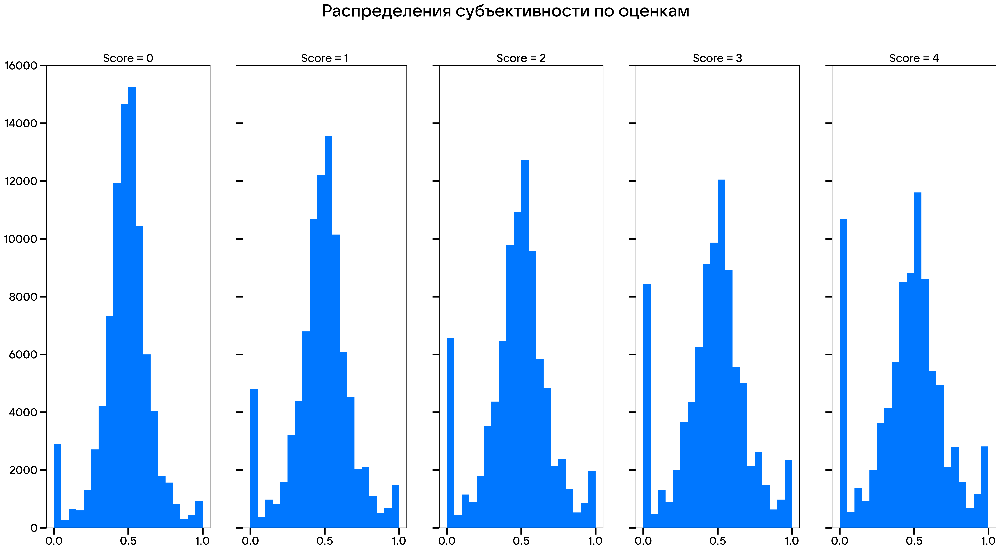

In [32]:
fig, axs = plt.subplots(1, 5, sharey=True)
axs[0].hist(ranking_train_exploded[ranking_train_exploded['score'] == 0]['subjectivity'], bins=20, color = '#0077ff')
axs[1].hist(ranking_train_exploded[ranking_train_exploded['score'] == 1]['subjectivity'], bins=20, color = '#0077ff')
axs[2].hist(ranking_train_exploded[ranking_train_exploded['score'] == 2]['subjectivity'], bins=20, color = '#0077ff')
axs[3].hist(ranking_train_exploded[ranking_train_exploded['score'] == 3]['subjectivity'], bins=20, color = '#0077ff')
axs[4].hist(ranking_train_exploded[ranking_train_exploded['score'] == 4]['subjectivity'], bins=20, color = '#0077ff')

axs[0].set_title('Score = 0', fontproperties=fontprop, size=20)
axs[1].set_title('Score = 1', fontproperties=fontprop, size=20)
axs[2].set_title('Score = 2', fontproperties=fontprop, size=20)
axs[3].set_title('Score = 3', fontproperties=fontprop, size=20)
axs[4].set_title('Score = 4', fontproperties=fontprop, size=20)

fig.suptitle("Распределения субъективности по оценкам", fontproperties=fontprop, size=30)
plt.sca(axs[1])
plt.xticks(fontproperties=fontprop, size=20)
plt.sca(axs[2])
plt.xticks(fontproperties=fontprop, size=20)
plt.sca(axs[3])
plt.xticks(fontproperties=fontprop, size=20)
plt.sca(axs[4])
plt.xticks(fontproperties=fontprop, size=20)
plt.sca(axs[0])
plt.xticks(fontproperties=fontprop, size=20)
plt.yticks(fontproperties=fontprop, size=20)

plt.savefig("Распределения субъективности по оценкам.png", transparent=True)
files.download("Распределения субъективности по оценкам.png")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

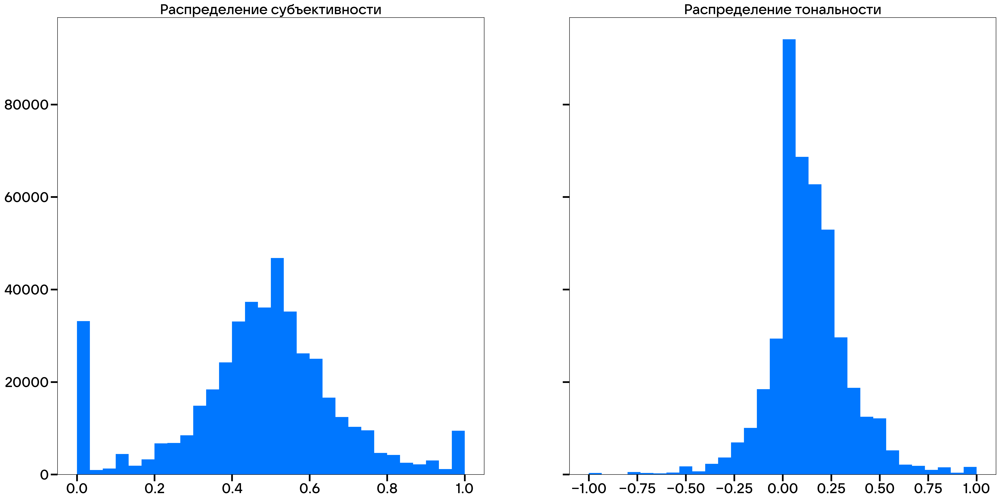

In [33]:
fig, axs = plt.subplots(1, 2, sharey=True)

axs[0].hist(ranking_train_exploded['subjectivity'], bins=30, color = '#0077ff')
axs[1].hist(ranking_train_exploded['polarity'], bins=30, color = '#0077ff')

axs[0].set_title('Распределение субъективности', fontproperties=fontprop, size=25)
axs[1].set_title('Распределение тональности', fontproperties=fontprop, size=25)


plt.sca(axs[1])
plt.xticks(fontproperties=fontprop, size=25)
plt.sca(axs[0])
plt.xticks(fontproperties=fontprop, size=25)
plt.yticks(fontproperties=fontprop, size=25)

plt.savefig("Распределения субъективности и тональности.png", transparent=True)
files.download("Распределения субъективности и тональности.png")

In [34]:
ranking_train_exploded['polarity_text'] = ranking_train_exploded['text'].apply(lambda text: TextBlob(text).sentiment[0])
ranking_train_exploded['subjectivity_text'] = ranking_train_exploded['text'].apply(lambda text: TextBlob(text).sentiment[1])

In [35]:
ranking_train_exploded[['polarity_text', 'polarity']].corr()

,polarity_text,polarity
polarity_text,1.000000,0.061127
polarity,0.061127,1.000000


In [37]:
def clear_text(string):
  string = html.unescape(string.lower())    # Избавляемя от html-формата записи строк
  string = re.sub(r'_', '', string)         # Убираем все нижние подчеркивания
  string = re.sub(r'http\S+', '', string)   # Убираем все ссылки
  string = re.sub(r'\W+\d+\W+', '', string) # Убираем одиноко стоящие цифары и чисала
  return string

In [38]:
ranking_train_exploded['text_clear'] = ranking_train_exploded.apply(lambda row: clear_text(row['text']), axis=1)
ranking_train_exploded['comments_clear'] = ranking_train_exploded.apply(lambda row: clear_text(row['comments']), axis=1)

ranking_train_exploded['polarity_text_clear'] = ranking_train_exploded['text_clear'].apply(lambda text: TextBlob(text).sentiment[0])
ranking_train_exploded['subjectivity_text_clear'] = ranking_train_exploded['text_clear'].apply(lambda text: TextBlob(text).sentiment[1])

ranking_train_exploded['polarity_comments_clear'] = ranking_train_exploded['comments_clear'].apply(lambda text: TextBlob(text).sentiment[0])
ranking_train_exploded['subjectivity_comments_clear'] = ranking_train_exploded['comments_clear'].apply(lambda text: TextBlob(text).sentiment[1])

In [199]:
y = ranking_train_exploded.group('score').mean()

AttributeError: ignored

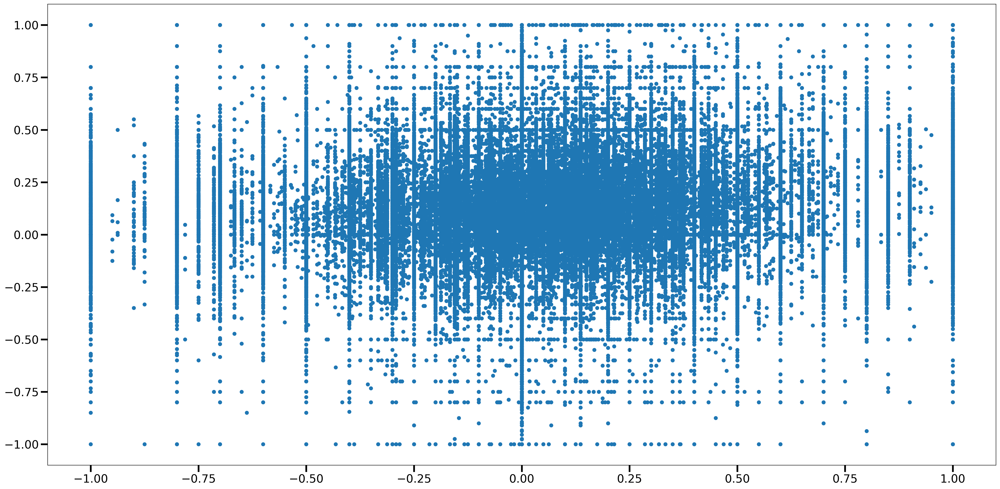

In [39]:
plt.scatter(ranking_train_exploded['polarity_text_clear'], ranking_train_exploded['polarity_comments_clear'])

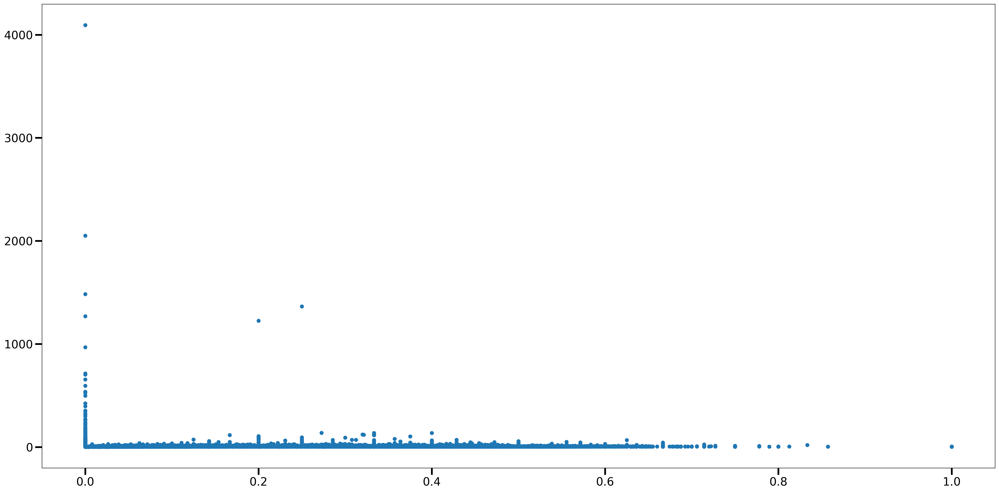

In [40]:
plt.scatter(ranking_train_exploded['percent_of_stop_words_with_all_words'], ranking_train_exploded['avg_len_word'])

In [217]:
ranking_train_exploded['len_comm'] = ranking_train_exploded['comments'].apply(lambda x: len(x))
ranking_train_exploded['avg_len_word']
ranking_train_exploded['len_sent'] = ranking_train_exploded['sentences'] * ranking_train_exploded['num_of_symbols']

groupted = ranking_train_exploded.groupby('score').mean()[['len_comm', 'avg_len_word', 'len_sent']]
groupted

,len_comm,avg_len_word,len_sent
score,,,
0,839.525679,6.568544,36.108793
1,574.036694,6.555599,26.215482
2,462.124621,6.583192,22.195725
3,396.662694,6.592285,20.037840
4,343.756001,6.560850,18.154055


(array([-1.,  0.,  1.,  2.,  3.,  4.,  5.]),
 [Text(-1.0, 0, '−1'),
  Text(0.0, 0, '0'),
  Text(1.0, 0, '1'),
  Text(2.0, 0, '2'),
  Text(3.0, 0, '3'),
  Text(4.0, 0, '4'),
  Text(5.0, 0, '5')])

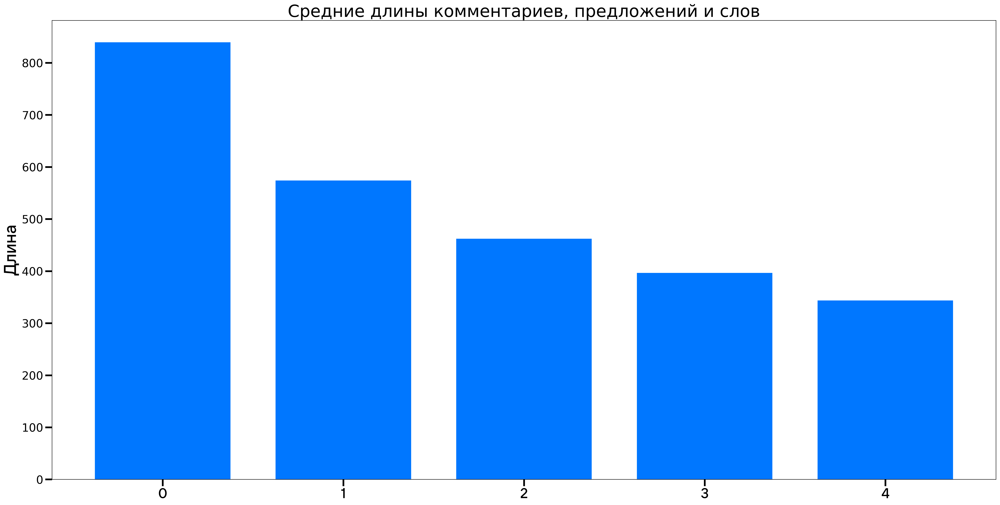

In [222]:
fig, ax = plt.subplots()

ax.bar(list(groupted.index), groupted['len_comm'].to_list(), width=0.75, color='#0077ff')

ax.set_title('Средние длины комментариев', size=30)
ax.set_ylabel('Длина', fontproperties=fontprop, size=30)

plt.xticks(fontproperties=fontprop, size=25)

#plt.savefig("freq_of_commwords.png", transparent=True)
#files.download("freq_of_commwords.png") 

(array([-1.,  0.,  1.,  2.,  3.,  4.,  5.]),
 [Text(-1.0, 0, '−1'),
  Text(0.0, 0, '0'),
  Text(1.0, 0, '1'),
  Text(2.0, 0, '2'),
  Text(3.0, 0, '3'),
  Text(4.0, 0, '4'),
  Text(5.0, 0, '5')])

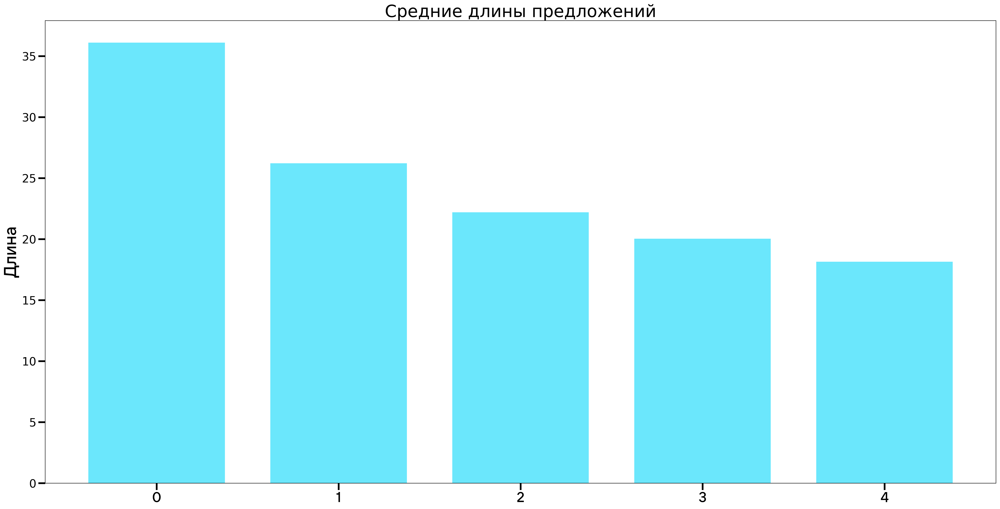

In [226]:
fig, ax = plt.subplots()

#ax.bar(list(groupted.index), groupted['len_comm'].to_list(), width=0.75, color='#0077ff')
ax.bar(list(groupted.index), groupted['len_sent'].to_list(), width=0.75, color='#6be7fc')
#ax.bar(list(groupted.index), groupted['len_sent'].to_list(), width=0.75, color='#752bb8')

ax.set_title('Средние длины предложений', size=30)
ax.set_ylabel('Длина', fontproperties=fontprop, size=30)

plt.xticks(fontproperties=fontprop, size=25)

#plt.savefig("freq_of_commwords.png", transparent=True)
#files.download("freq_of_commwords.png") 

(array([-1.,  0.,  1.,  2.,  3.,  4.,  5.]),
 [Text(-1.0, 0, '−1'),
  Text(0.0, 0, '0'),
  Text(1.0, 0, '1'),
  Text(2.0, 0, '2'),
  Text(3.0, 0, '3'),
  Text(4.0, 0, '4'),
  Text(5.0, 0, '5')])

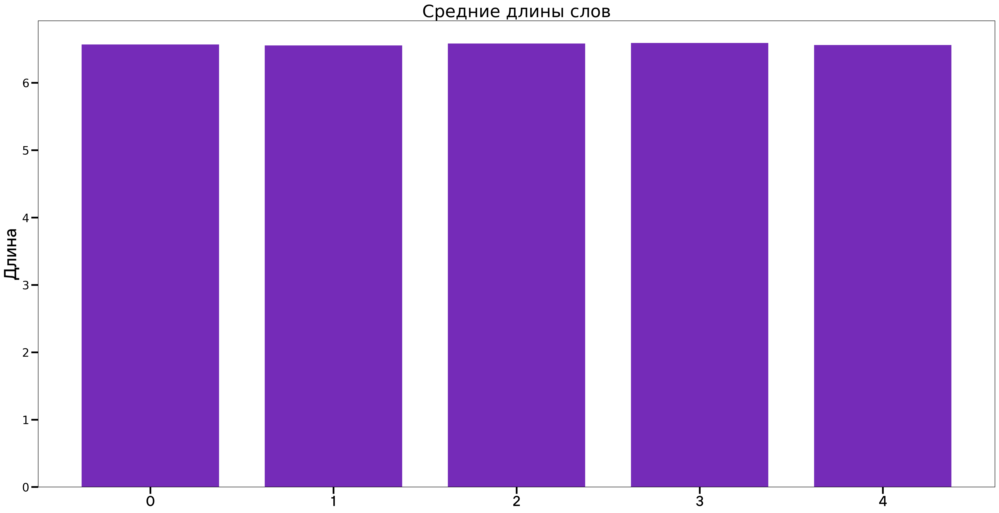

In [228]:
fig, ax = plt.subplots()

#ax.bar(list(groupted.index), groupted['len_comm'].to_list(), width=0.75, color='#0077ff')
#ax.bar(list(groupted.index), groupted['avg_len_word'].to_list(), width=0.75, color='#6be7fc')
ax.bar(list(groupted.index), groupted['avg_len_word'].to_list(), width=0.75, color='#752bb8')

ax.set_title('Средние длины слов', size=30)
ax.set_ylabel('Длина', fontproperties=fontprop, size=30)

plt.xticks(fontproperties=fontprop, size=25)

#plt.savefig("freq_of_commwords.png", transparent=True)
#files.download("freq_of_commwords.png") 

In [41]:
list(ranking_train_exploded.groupby('score').mean()['num_of_symbols'].index)

[0, 1, 2, 3, 4]

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

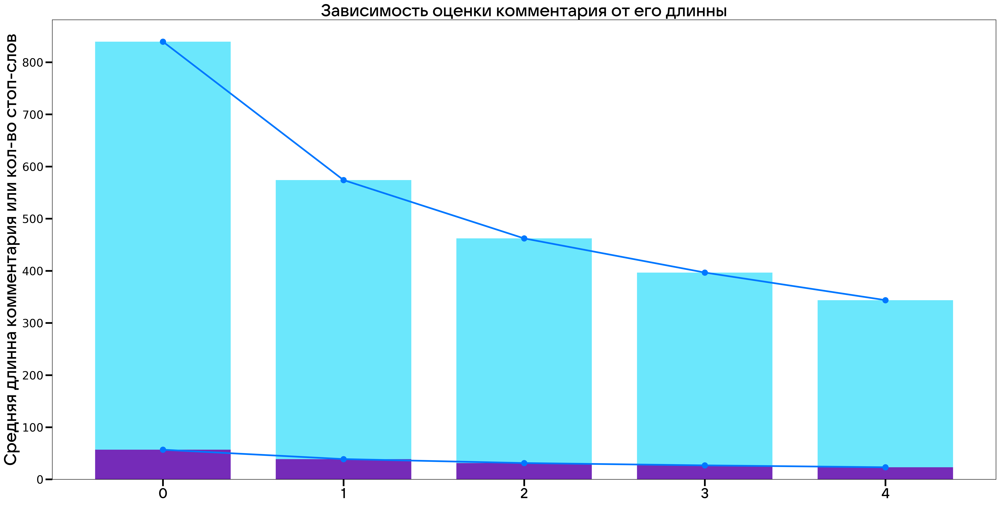

In [42]:
fig, ax = plt.subplots()

scores = list(ranking_train_exploded.groupby('score').mean()['num_of_symbols'].index)
mean_len_comm = ranking_train_exploded.groupby('score').mean()['num_of_symbols'].to_list()
mean_sw_comm = ranking_train_exploded.groupby('score').mean()['num_of_stop_words'].to_list()

ax.bar(scores, mean_len_comm, width=0.75, color='#6be7fc')
ax.plot(scores, mean_len_comm, color='#0077ff', linewidth=3)
ax.scatter(scores, mean_len_comm, color='#0077ff', s=100)

ax.bar(scores, mean_sw_comm, width=0.75, color='#752bb8')
ax.plot(scores, mean_sw_comm, color='#0077ff', linewidth=3)
ax.scatter(scores, mean_sw_comm, color='#0077ff', s=100)

ax.set_title('Зависимость оценки комментария от его длинны', fontproperties=fontprop, size=30)
ax.set_ylabel('Средняя длинна комментария или кол-во стоп-слов', fontproperties=fontprop, size=30)

plt.xticks(fontproperties=fontprop, size=25)

from google.colab import files

plt.savefig("Зависимость оценки комментария от его длинны.png", transparent=True)
files.download("Зависимость оценки комментария от его длинны.png") 

In [30]:
words_by_score = test[['comments', 'score']].explode('comments')

In [35]:
words_by_score_0 = pd.DataFrame(Counter(words_by_score[words_by_score['score'] == 0]['comments']).most_common()).head(10)
words_by_score_1 = pd.DataFrame(Counter(words_by_score[words_by_score['score'] == 1]['comments']).most_common()).head(10)
words_by_score_2 = pd.DataFrame(Counter(words_by_score[words_by_score['score'] == 2]['comments']).most_common()).head(10)
words_by_score_3 = pd.DataFrame(Counter(words_by_score[words_by_score['score'] == 3]['comments']).most_common()).head(10)
words_by_score_4 = pd.DataFrame(Counter(words_by_score[words_by_score['score'] == 4]['comments']).most_common()).head(10)

In [76]:
words_by_score_0[1].values

array([46828, 40617, 40351, 36851, 34637, 32545, 28638, 28290, 27237,
       26109])

In [97]:
words_by_score_0[0]

0      like
1    people
2       one
3     would
4       get
5      time
6      make
7     thing
8      work
9     think
Name: 0, dtype: object

In [99]:
ax.annotate?

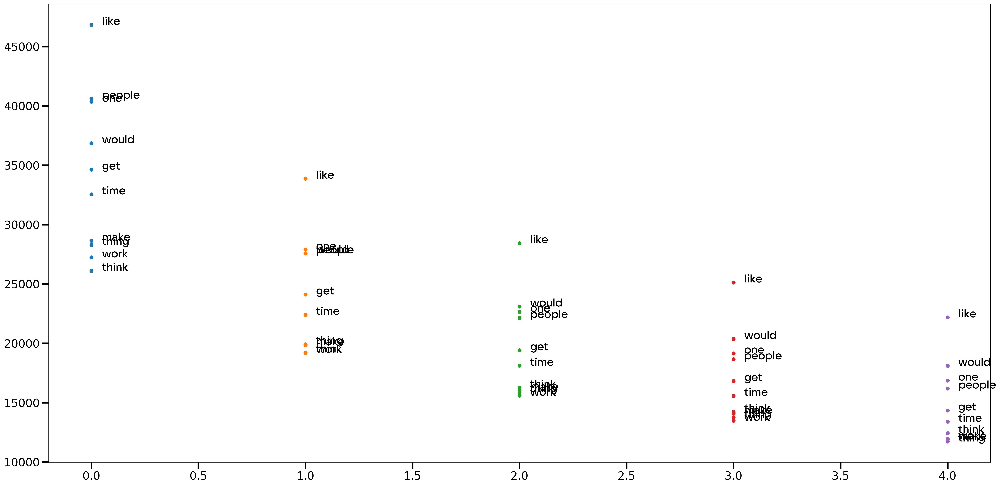

In [117]:
plt.scatter([0 for i in range(10)], words_by_score_0[1].values)
plt.scatter([1 for i in range(10)], words_by_score_1[1].values)
plt.scatter([2 for i in range(10)], words_by_score_2[1].values)
plt.scatter([3 for i in range(10)], words_by_score_3[1].values)
plt.scatter([4 for i in range(10)], words_by_score_4[1].values)

ax = plt.gca()

for row in range(10):
  plt.annotate(words_by_score_0[0].iloc[row], (0+0.05,words_by_score_0[1].iloc[row]), fontproperties=fontprop, size=20)
  plt.annotate(words_by_score_1[0].iloc[row], (1+0.05,words_by_score_1[1].iloc[row]), fontproperties=fontprop, size=20)
  plt.annotate(words_by_score_2[0].iloc[row], (2+0.05,words_by_score_2[1].iloc[row]), fontproperties=fontprop, size=20)
  plt.annotate(words_by_score_3[0].iloc[row], (3+0.05,words_by_score_3[1].iloc[row]), fontproperties=fontprop, size=20)
  plt.annotate(words_by_score_4[0].iloc[row], (4+0.05,words_by_score_4[1].iloc[row]), fontproperties=fontprop, size=20)

In [103]:
10 % 2

0

In [167]:
squarify.plot?

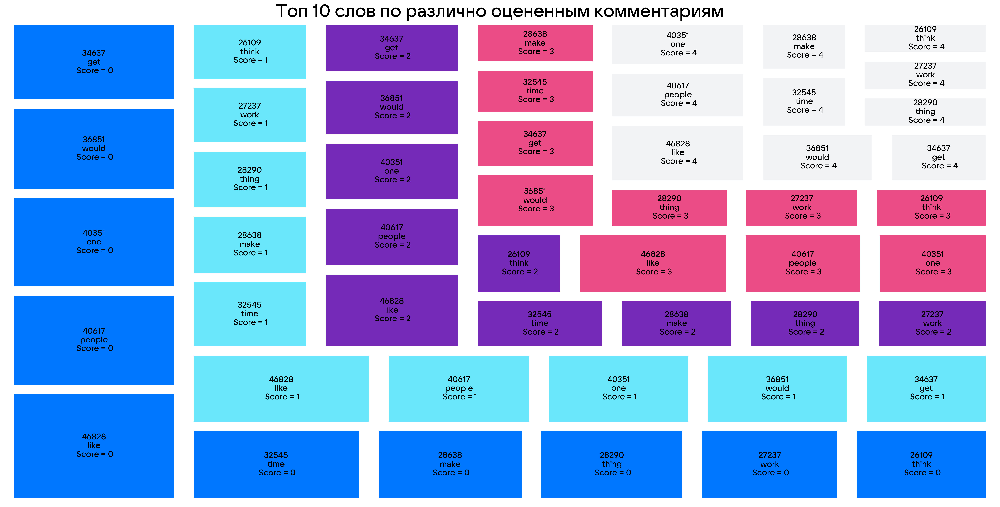

In [185]:
# Prepare Data
labels = [f'{words_by_score_0[1].iloc[i]}\n{words_by_score_0[0].iloc[i]}\n Score = {0}' for i in range(10)] + [f'{words_by_score_0[1].iloc[i]}\n{words_by_score_0[0].iloc[i]}\n Score = {1}' for i in range(10)] + [f'{words_by_score_0[1].iloc[i]}\n{words_by_score_0[0].iloc[i]}\n Score = {2}' for i in range(10)] + [f'{words_by_score_0[1].iloc[i]}\n{words_by_score_0[0].iloc[i]}\n Score = {3}' for i in range(10)] + [f'{words_by_score_0[1].iloc[i]}\n{words_by_score_0[0].iloc[i]}\n Score = {4}' for i in range(10)]
sizes = words_by_score_0[1].values.tolist() + words_by_score_1[1].values.tolist() + words_by_score_2[1].values.tolist() + words_by_score_3[1].values.tolist() + words_by_score_4[1].values.tolist()
colors = ['#0077ff' for i in range(10)] + ['#6be7fc' for i in range(10)] + ['#752bb8' for i in range(10)] + ['#EB4C86' for i in range(10)] + ['#f2f3f5' for i in range(10)]

# Draw Plot
squarify.plot(sizes=sizes, label=labels, pad=1, color=colors, text_kwargs={'fontsize':14, 'fontproperties':fontprop})

# Decorate
plt.title('Топ 10 слов по различно оцененным комментариям', fontproperties=fontprop, size=30)
plt.axis('off')
plt.show()

In [66]:
import string
punctuations = string.punctuation

ranking_train_exploded['punctuation'] = ranking_train_exploded['comments'].apply(lambda x: sum([1 for char in x if char in punctuations]))/ranking_train_exploded['num_of_symbols']

ranking_train_exploded['sentences'] = ranking_train_exploded['comments'].apply(lambda x: len(nltk.sent_tokenize(x)))/ranking_train_exploded['num_of_words']

In [ ]:
fig, ax = plt.subplots()

ax.bar(list(series_of_bad_comms.index), series_of_bad_comms.to_list(), width=0.75, color='#0077ff')

ax.set_title('Топ 10 используемых слов в комментариях', size=30)
ax.set_ylabel('Кол-во встреченных', fontproperties=fontprop, size=30)

plt.xticks(fontproperties=fontprop, size=25)

#plt.savefig("freq_of_commwords.png", transparent=True)
#files.download("freq_of_commwords.png") 

In [72]:
punctuation_0 = ranking_train_exploded[['punctuation','score']][ranking_train_exploded['score'] == 0]
punctuation_1 = ranking_train_exploded[['punctuation','score']][ranking_train_exploded['score'] == 1]
punctuation_2 = ranking_train_exploded[['punctuation','score']][ranking_train_exploded['score'] == 2]
punctuation_3 = ranking_train_exploded[['punctuation','score']][ranking_train_exploded['score'] == 3]
punctuation_4 = ranking_train_exploded[['punctuation','score']][ranking_train_exploded['score'] == 4]

In [ ]:
sentences_0 = ranking_train_exploded[['sentences','score']][ranking_train_exploded['score'] == 0]
sentences_1 = ranking_train_exploded[['sentences','score']][ranking_train_exploded['score'] == 1]
sentences_2 = ranking_train_exploded[['sentences','score']][ranking_train_exploded['score'] == 2]
sentences_3 = ranking_train_exploded[['sentences','score']][ranking_train_exploded['score'] == 3]
sentences_4 = ranking_train_exploded[['sentences','score']][ranking_train_exploded['score'] == 4]

In [ ]:
fig, ax = plt.subplots()

ax.bar(list(series_of_bad_comms.index), series_of_bad_comms.to_list(), width=0.75, color='#0077ff')

ax.set_title('Топ 10 используемых слов в комментариях', size=30)
ax.set_ylabel('Кол-во встреченных', fontproperties=fontprop, size=30)

plt.xticks(fontproperties=fontprop, size=25)

#plt.savefig("freq_of_commwords.png", transparent=True)
#files.download("freq_of_commwords.png") 

In [128]:
np.unique(words_by_score_0[0].head(n).to_list()[:-1] + words_by_score_1[0].head(n).to_list()[:-1] + words_by_score_2[0].head(n).to_list()[:-1] + words_by_score_3[0].head(n).to_list()[:-1] + words_by_score_4[0].head(n).to_list()[:-1])

array(['get', 'like', 'make', 'one', 'people', 'thing', 'think', 'time',
       'work', 'would'], dtype='<U6')

In [131]:
int(words_by_score_0[words_by_score_0[0] == 'like'][1])

46828

In [152]:
list(np.unique(words_by_score_0[0].head(n).to_list()[:-1] + words_by_score_1[0].head(n).to_list()[:-1] + words_by_score_2[0].head(n).to_list()[:-1] + words_by_score_3[0].head(n).to_list()[:-1] + words_by_score_4[0].head(n).to_list()[:-1]))

['get',
 'like',
 'make',
 'one',
 'people',
 'thing',
 'think',
 'time',
 'work',
 'would']

In [153]:
list(np.unique(words_by_score_0[0].head(n).to_list()[:-1] + words_by_score_1[0].head(n).to_list()[:-1] + words_by_score_2[0].head(n).to_list()[:-1] + words_by_score_3[0].head(n).to_list()[:-1] + words_by_score_4[0].head(n).to_list()[:-1]))

['get',
 'like',
 'make',
 'one',
 'people',
 'thing',
 'think',
 'time',
 'work',
 'would']

In [162]:
words_by_score_0[0].head(n).to_list()[:-1]

['like', 'people', 'one', 'would', 'get', 'time', 'make', 'thing', 'work']

(array([], dtype=float64), [])

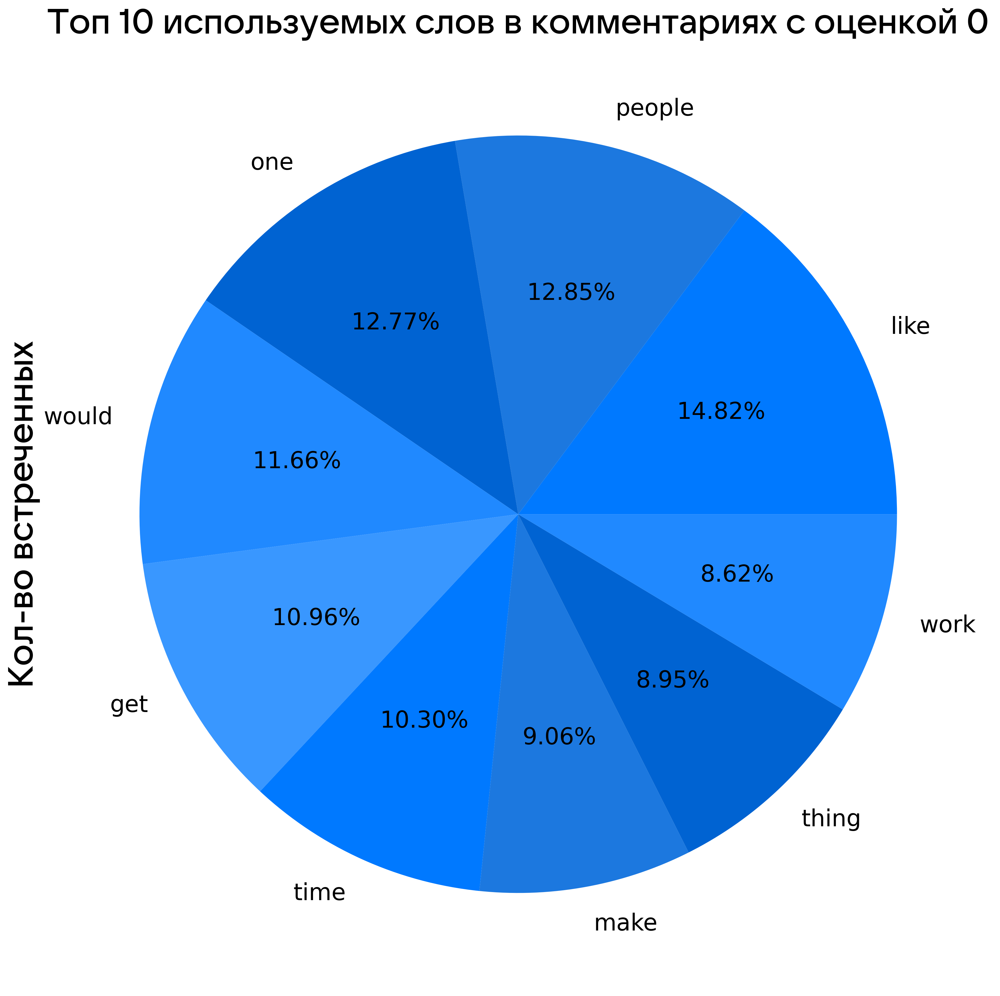

In [196]:
fig, ax = plt.subplots()

n = 10

words = words_by_score_0[0].head(n).to_list()[:-1]
freq = words_by_score_0[1].head(n).to_list()[:-1]

ax.pie(freq, labels=words, autopct='%1.2f%%', colors=['#0079FF', '#1C78DF', '#0063D2', '#2089FF', '#3997FF'])

ax.set_title('Топ 10 используемых слов в комментариях с оценкой 0', fontproperties=fontprop, size=30)
ax.set_ylabel('Кол-во встреченных', fontproperties=fontprop, size=30)

plt.xticks(fontproperties=fontprop, size=25)

#from google.colab import files

#plt.savefig("Топ 10 используемых слов в комментариях с оценкой 0.png", transparent=True)
#files.download("Топ 10 используемых слов в комментариях с оценкой 0.png") 

In [143]:
freq, words

([34637, 46828, 28638, 40351, 40617, 28290, 26109, 32545, 27237, 36851],
 ['get',
  'like',
  'make',
  'one',
  'people',
  'thing',
  'think',
  'time',
  'work',
  'would'])

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

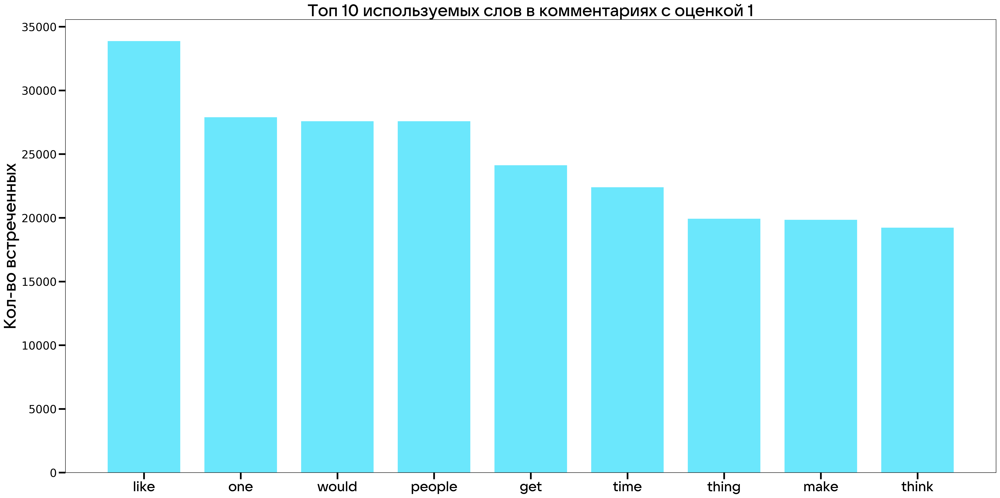

In [186]:
fig, ax = plt.subplots()

n = 10

words = words_by_score_1[0].head(n).to_list()[:-1]
freq = words_by_score_1[1].head(n).to_list()[:-1]

ax.bar(words, freq, width=0.75, color='#6be7fc')

ax.set_title('Топ 10 используемых слов в комментариях с оценкой 1', fontproperties=fontprop, size=30)
ax.set_ylabel('Кол-во встреченных', fontproperties=fontprop, size=30)

plt.xticks(fontproperties=fontprop, size=25)

from google.colab import files

plt.savefig("Топ 10 используемых слов в комментариях с оценкой 1.png", transparent=True)
files.download("Топ 10 используемых слов в комментариях с оценкой 1.png") 

(array([], dtype=float64), [])

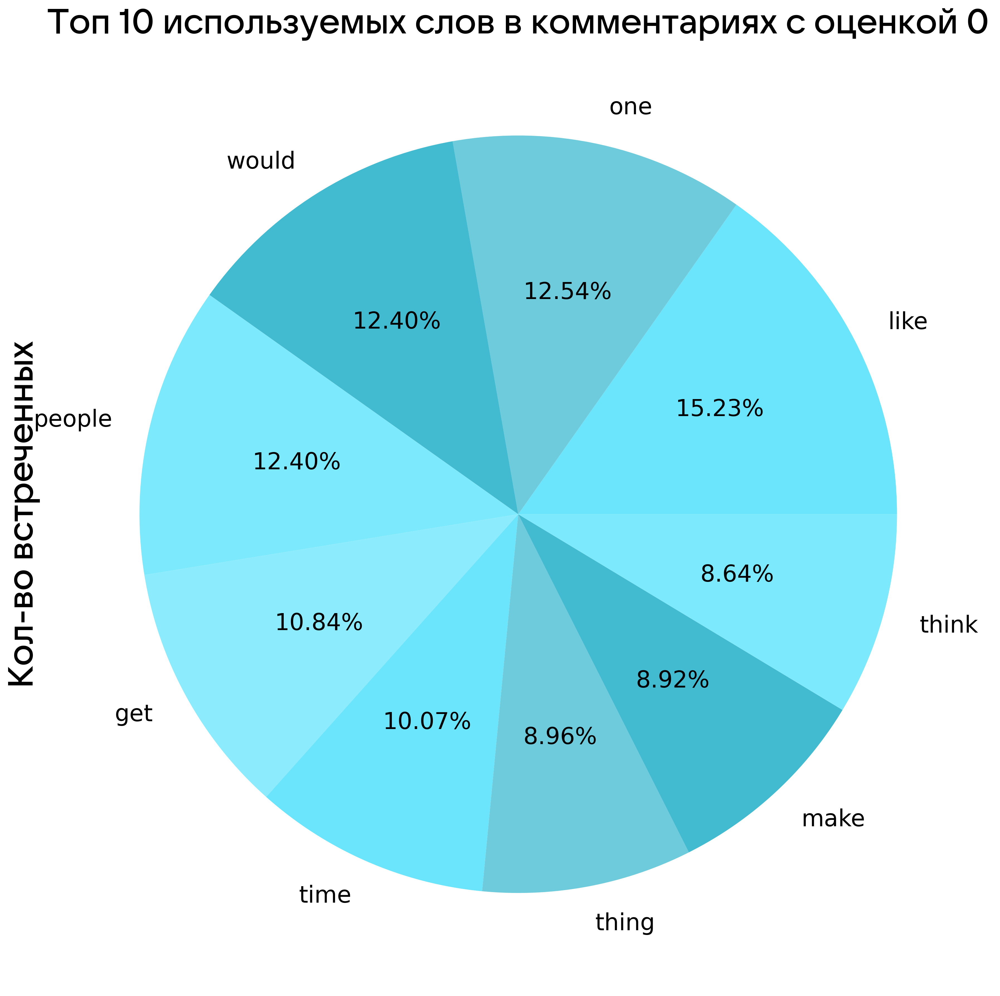

In [200]:
fig, ax = plt.subplots()

n = 10

words = words_by_score_1[0].head(n).to_list()[:-1]
freq = words_by_score_1[1].head(n).to_list()[:-1]

ax.pie(freq, labels=words, autopct='%1.2f%%', colors=['#6BE5FC', '#6DCBDC', '#42BAD0', '#7DE9FD', '#8CEBFD'])

ax.set_title('Топ 10 используемых слов в комментариях с оценкой 0', fontproperties=fontprop, size=30)
ax.set_ylabel('Кол-во встреченных', fontproperties=fontprop, size=30)

plt.xticks(fontproperties=fontprop, size=25)

#from google.colab import files

#plt.savefig("Топ 10 используемых слов в комментариях с оценкой 0.png", transparent=True)
#files.download("Топ 10 используемых слов в комментариях с оценкой 0.png") 

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

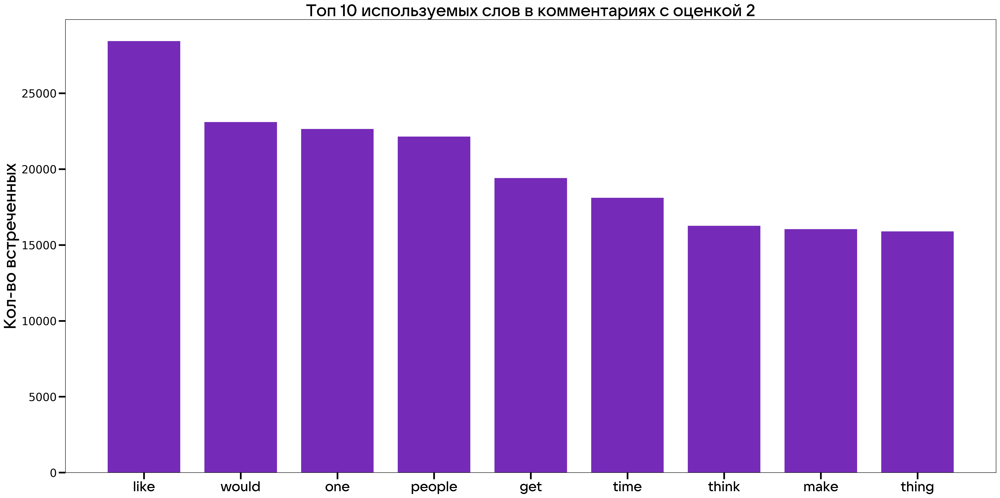

In [47]:
fig, ax = plt.subplots()

n = 10

words = words_by_score_2[0].head(n).to_list()[:-1]
freq = words_by_score_2[1].head(n).to_list()[:-1]

ax.bar(words, freq, width=0.75, color='#752bb8')

ax.set_title('Топ 10 используемых слов в комментариях с оценкой 2', fontproperties=fontprop, size=30)
ax.set_ylabel('Кол-во встреченных', fontproperties=fontprop, size=30)

plt.xticks(fontproperties=fontprop, size=25)

from google.colab import files

plt.savefig("Топ 10 используемых слов в комментариях с оценкой 2.png", transparent=True)
files.download("Топ 10 используемых слов в комментариях с оценкой 2.png") 

(array([], dtype=float64), [])

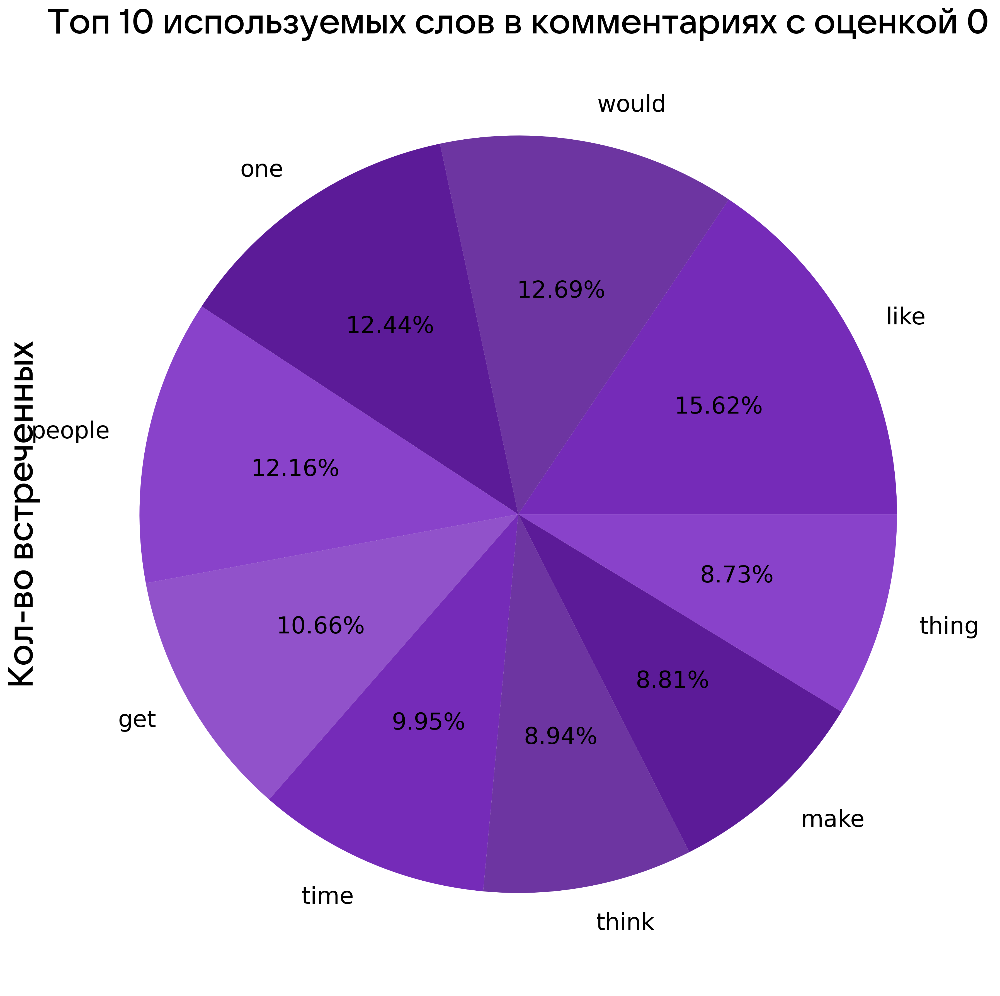

In [201]:
fig, ax = plt.subplots()

n = 10

words = words_by_score_2[0].head(n).to_list()[:-1]
freq = words_by_score_2[1].head(n).to_list()[:-1]

ax.pie(freq, labels=words, autopct='%1.2f%%', colors=['#752BB8', '#6D35A1', '#5C1B98', '#8942CA', '#9152CA'])

ax.set_title('Топ 10 используемых слов в комментариях с оценкой 0', fontproperties=fontprop, size=30)
ax.set_ylabel('Кол-во встреченных', fontproperties=fontprop, size=30)

plt.xticks(fontproperties=fontprop, size=25)

#from google.colab import files

#plt.savefig("Топ 10 используемых слов в комментариях с оценкой 0.png", transparent=True)
#files.download("Топ 10 используемых слов в комментариях с оценкой 0.png") 

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

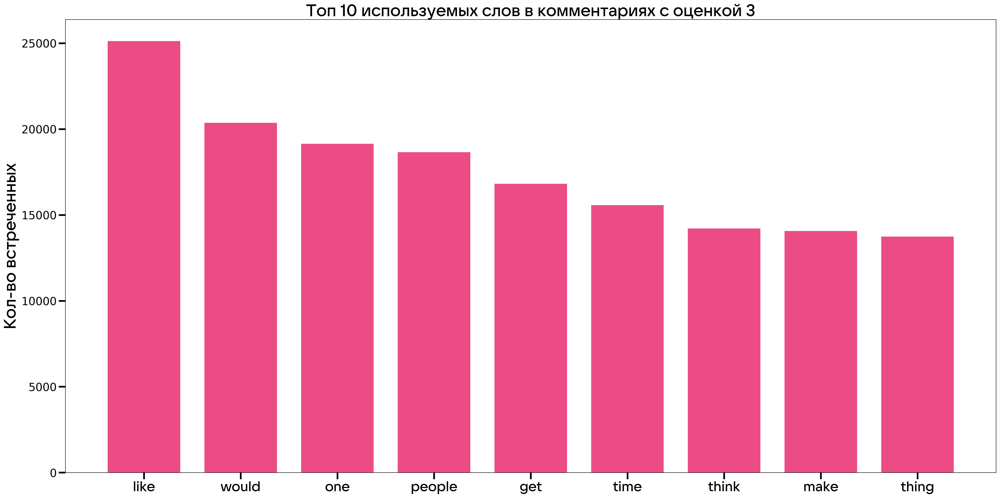

In [48]:
fig, ax = plt.subplots()

n = 10

words = words_by_score_3[0].head(n).to_list()[:-1]
freq = words_by_score_3[1].head(n).to_list()[:-1]

ax.bar(words, freq, width=0.75, color='#EB4C86')

ax.set_title('Топ 10 используемых слов в комментариях с оценкой 3', fontproperties=fontprop, size=30)
ax.set_ylabel('Кол-во встреченных', fontproperties=fontprop, size=30)

plt.xticks(fontproperties=fontprop, size=25)

from google.colab import files

plt.savefig("Топ 10 используемых слов в комментариях с оценкой 3.png", transparent=True)
files.download("Топ 10 используемых слов в комментариях с оценкой 3.png") 

(array([], dtype=float64), [])

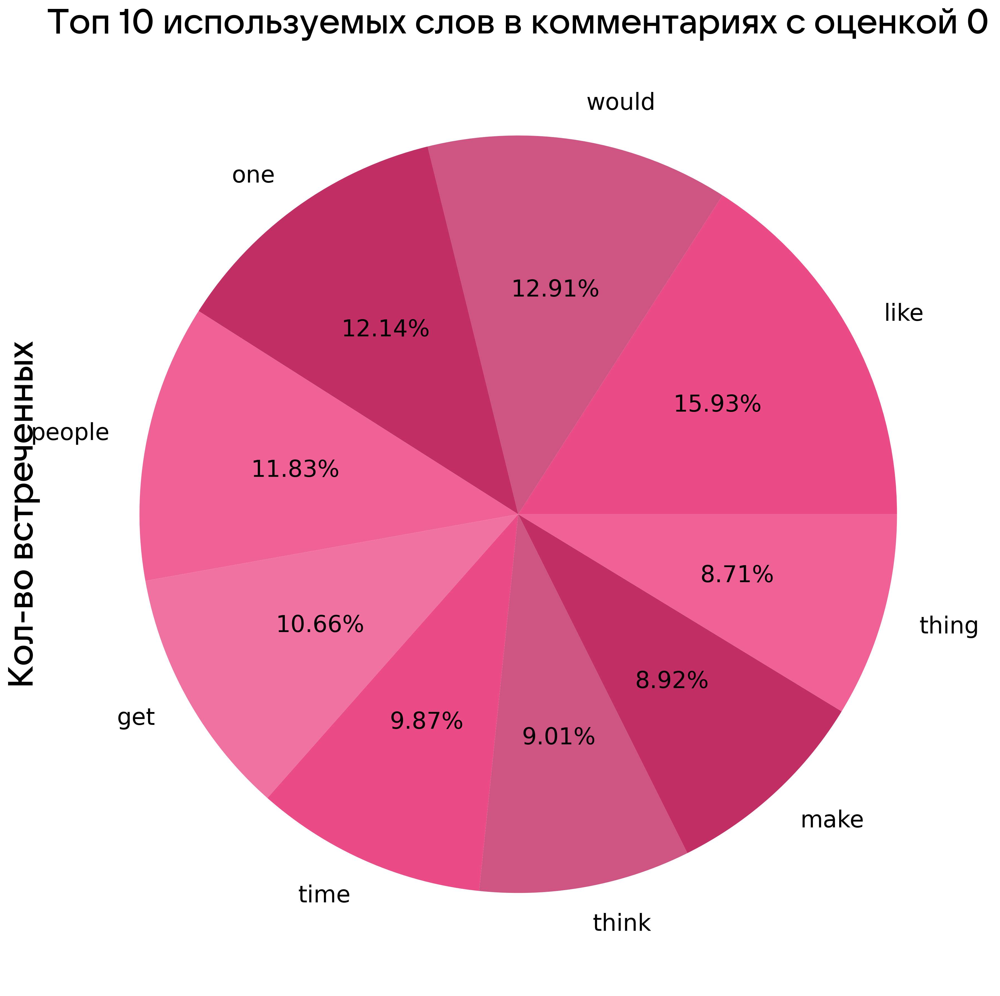

In [203]:
fig, ax = plt.subplots()

n = 10

words = words_by_score_3[0].head(n).to_list()[:-1]
freq = words_by_score_3[1].head(n).to_list()[:-1]

ax.pie(freq, labels=words, autopct='%1.2f%%', colors=['#EB4C87', '#CE5481', '#C22F65', '#F06296', '#F072A1'])

ax.set_title('Топ 10 используемых слов в комментариях с оценкой 0', fontproperties=fontprop, size=30)
ax.set_ylabel('Кол-во встреченных', fontproperties=fontprop, size=30)

plt.xticks(fontproperties=fontprop, size=25)

#from google.colab import files

#plt.savefig("Топ 10 используемых слов в комментариях с оценкой 0.png", transparent=True)
#files.download("Топ 10 используемых слов в комментариях с оценкой 0.png") 

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

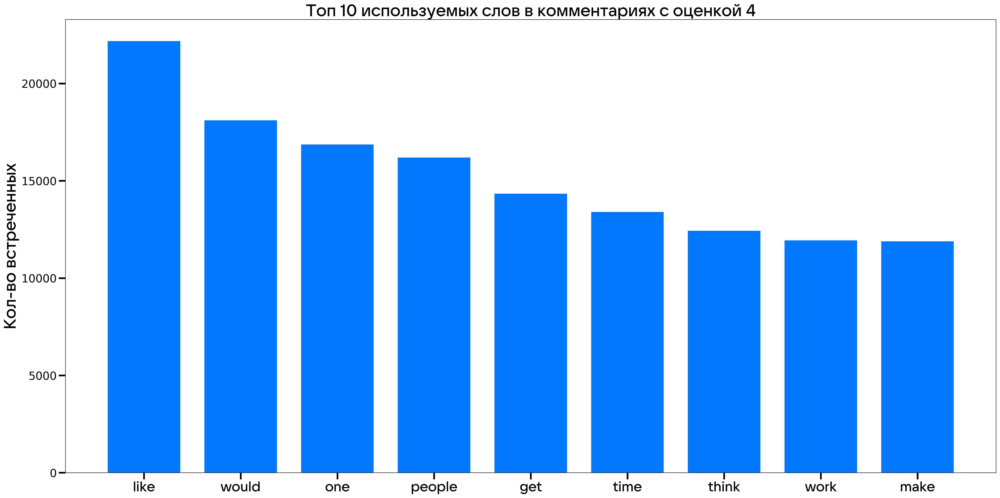

In [49]:
fig, ax = plt.subplots()

n = 10

words = words_by_score_4[0].head(n).to_list()[:-1]
freq = words_by_score_4[1].head(n).to_list()[:-1]

ax.bar(words, freq, width=0.75, color='#0077ff')

ax.set_title('Топ 10 используемых слов в комментариях с оценкой 4', fontproperties=fontprop, size=30)
ax.set_ylabel('Кол-во встреченных', fontproperties=fontprop, size=30)

plt.xticks(fontproperties=fontprop, size=25)

from google.colab import files

plt.savefig("Топ 10 используемых слов в комментариях с оценкой 4.png", transparent=True)
files.download("Топ 10 используемых слов в комментариях с оценкой 4.png") 

(array([], dtype=float64), [])

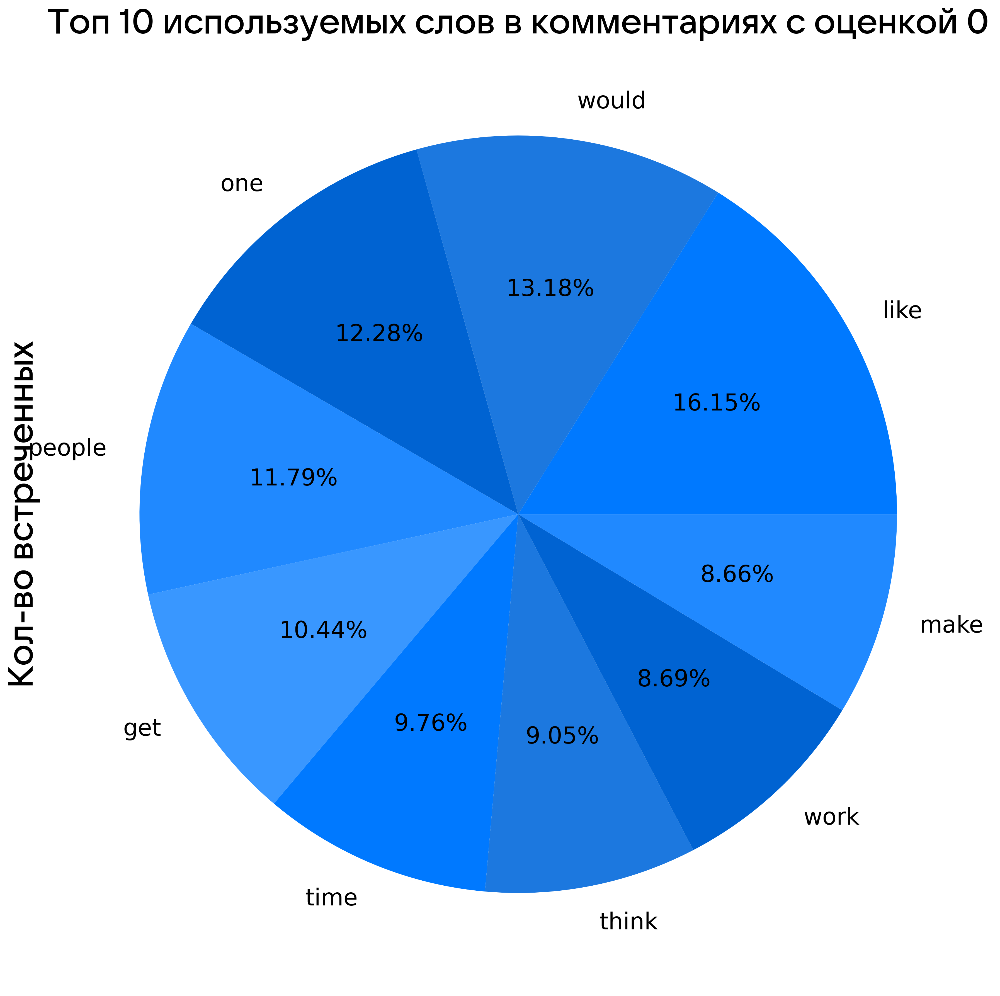

In [204]:
fig, ax = plt.subplots()

n = 10

words = words_by_score_4[0].head(n).to_list()[:-1]
freq = words_by_score_4[1].head(n).to_list()[:-1]

ax.pie(freq, labels=words, autopct='%1.2f%%', colors=['#0079FF', '#1C78DF', '#0063D2', '#2089FF', '#3997FF'])

ax.set_title('Топ 10 используемых слов в комментариях с оценкой 0', fontproperties=fontprop, size=30)
ax.set_ylabel('Кол-во встреченных', fontproperties=fontprop, size=30)

plt.xticks(fontproperties=fontprop, size=25)

#from google.colab import files

#plt.savefig("Топ 10 используемых слов в комментариях с оценкой 0.png", transparent=True)
#files.download("Топ 10 используемых слов в комментариях с оценкой 0.png") 

In [ ]:
fig, ax = plt.subplots()

n = 10

words = words_by_score_2[0].head(n).to_list()[:-1]
freq = words_by_score_2[1].head(n).to_list()[:-1]

ax.pie(freq, labels=words, autopct='%1.2f%%', colors=['#EB4C87', '#CE5481', '#C22F65', '#F06296', '#F072A1'])

ax.set_title('Топ 10 используемых слов в комментариях с оценкой 0', fontproperties=fontprop, size=30)
ax.set_ylabel('Кол-во встреченных', fontproperties=fontprop, size=30)

plt.xticks(fontproperties=fontprop, size=25)

#from google.colab import files

#plt.savefig("Топ 10 используемых слов в комментариях с оценкой 0.png", transparent=True)
#files.download("Топ 10 используемых слов в комментариях с оценкой 0.png") 

In [50]:
nltk.download('opinion_lexicon')

[nltk_data] Downloading package opinion_lexicon to /root/nltk_data...
[nltk_data]   Unzipping corpora/opinion_lexicon.zip.


True

In [53]:
from nltk.corpus import opinion_lexicon

In [57]:
len(opinion_lexicon.negative())

4783

In [61]:
len(opinion_lexicon.positive())

2006

In [67]:
sarcasm_checker = []
for lst in test['comments']:
  flag = 0
  for word in lst:
    if word in opinion_lexicon.positive():
      flag+=1
    elif word in opinion_lexicon.negative():
      flag-=1
  sarcasm_checker.append(flag)

KeyboardInterrupt: ignored

In [63]:
'like' in opinion_lexicon.words()

True